# Streetlight Vehicle Miles Traveled EDA

In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.mlab as mlab
import matplotlib.pyplot as plt
import plotly as py
import plotly.figure_factory as ff
import pandas as pd
from tqdm import tqdm
import os
from os.path import join as oj
import numpy as np
from bokeh.plotting import figure, show, output_notebook, output_file, save
import sys

## Load in raw data

In [2]:
data_dir_raw = "../../data/county_level/raw/streetlight_vmt"
sys.path.append(data_dir_raw)
import load

In [3]:
orig_dir = os.getcwd()
os.chdir(data_dir_raw)
df_raw = load.load_streetlight_vmt()
os.chdir(orig_dir)

In [4]:
df_raw.shape

(119822, 7)

In [5]:
df_raw.head()

,statefp10,countyfp10,state_name,county_name,ref_dt,county_vmt,jan_avg_vmt
0,1,1,Alabama,Autauga,3/1/20,3890000,3571446
1,1,1,Alabama,Autauga,3/2/20,3630000,3571446
2,1,1,Alabama,Autauga,3/3/20,3570000,3571446
3,1,1,Alabama,Autauga,3/4/20,3480000,3571446
4,1,1,Alabama,Autauga,3/5/20,3970000,3571446


In [6]:
list(df_raw.keys())

['statefp10',
 'countyfp10',
 'state_name',
 'county_name',
 'ref_dt',
 'county_vmt',
 'jan_avg_vmt']

In [7]:
df_raw.dtypes

statefp10       int64
countyfp10      int64
state_name     object
county_name    object
ref_dt         object
county_vmt      int64
jan_avg_vmt     int64
dtype: object

In [8]:
df_raw.isna().sum()

statefp10      0
countyfp10     0
state_name     0
county_name    0
ref_dt         0
county_vmt     0
jan_avg_vmt    0
dtype: int64

## Clean data

In [9]:
os.chdir("../../data/")
from county_level.processed.streetlight_vmt import clean
data_dir_raw = './county_level/raw/streetlight_vmt'
data_dir_clean = './county_level/processed/streetlight_vmt'

In [10]:
os.chdir(data_dir_clean)
df = clean.clean_streetlight_vmt()
os.chdir(orig_dir)

In [11]:
df.shape

(2984, 83)

In [12]:
list(df.keys())

['countyFIPS',
 'VMT_percent_change2020-03-01',
 'VMT_percent_change2020-03-02',
 'VMT_percent_change2020-03-03',
 'VMT_percent_change2020-03-04',
 'VMT_percent_change2020-03-05',
 'VMT_percent_change2020-03-06',
 'VMT_percent_change2020-03-07',
 'VMT_percent_change2020-03-08',
 'VMT_percent_change2020-03-09',
 'VMT_percent_change2020-03-10',
 'VMT_percent_change2020-03-11',
 'VMT_percent_change2020-03-12',
 'VMT_percent_change2020-03-13',
 'VMT_percent_change2020-03-14',
 'VMT_percent_change2020-03-15',
 'VMT_percent_change2020-03-16',
 'VMT_percent_change2020-03-17',
 'VMT_percent_change2020-03-18',
 'VMT_percent_change2020-03-19',
 'VMT_percent_change2020-03-20',
 'VMT_percent_change2020-03-21',
 'VMT_percent_change2020-03-22',
 'VMT_percent_change2020-03-23',
 'VMT_percent_change2020-03-24',
 'VMT_percent_change2020-03-25',
 'VMT_percent_change2020-03-26',
 'VMT_percent_change2020-03-27',
 'VMT_percent_change2020-03-28',
 'VMT_percent_change2020-03-29',
 'VMT_percent_change2020-03-

In [13]:
df.dtypes

countyFIPS                       object
VMT_percent_change2020-03-01    float64
VMT_percent_change2020-03-02    float64
VMT_percent_change2020-03-03    float64
VMT_percent_change2020-03-04    float64
                                 ...   
VMT_per_capita2020-04-06        float64
VMT_per_capita2020-04-07        float64
VMT_per_capita2020-04-08        float64
VMT_per_capita2020-04-09        float64
VMT_per_capita2020-04-10        float64
Length: 83, dtype: object

In [14]:
df.head()

,countyFIPS,VMT_percent_change2020-03-01,VMT_percent_change2020-03-02,VMT_percent_change2020-03-03,VMT_percent_change2020-03-04,VMT_percent_change2020-03-05,VMT_percent_change2020-03-06,VMT_percent_change2020-03-07,VMT_percent_change2020-03-08,VMT_percent_change2020-03-09,...,VMT_per_capita2020-04-01,VMT_per_capita2020-04-02,VMT_per_capita2020-04-03,VMT_per_capita2020-04-04,VMT_per_capita2020-04-05,VMT_per_capita2020-04-06,VMT_per_capita2020-04-07,VMT_per_capita2020-04-08,VMT_per_capita2020-04-09,VMT_per_capita2020-04-10
0,01001,8.919468,1.639504,-0.040488,-2.560476,11.159458,57.079233,28.239374,14.519441,6.679479,...,33.717542,37.382493,39.581463,28.036869,17.005369,29.686097,30.602335,27.853622,34.267285,33.717542
1,01003,30.779643,8.059451,10.276055,4.180393,13.046810,45.187570,22.467377,14.155112,1.963789,...,49.707843,49.268922,51.518394,38.131292,23.811483,36.320742,39.667517,38.405618,42.630236,44.385922
2,01005,-2.947684,-6.909003,4.974955,15.538472,-4.268123,41.947266,35.345067,53.831223,0.353416,...,28.954365,30.192665,31.904432,22.471501,13.839822,27.861747,27.133336,27.279018,32.159376,32.122956
3,01007,5.647538,-1.124740,-1.801968,-3.156423,8.356449,32.736650,38.154473,9.710905,13.097044,...,39.406502,48.003491,46.694305,34.475235,20.336024,35.915339,34.737072,34.649793,41.501200,44.075933
4,01009,9.360840,-0.302510,3.704245,12.896212,10.303606,37.643816,19.966956,2.997171,15.724510,...,45.008897,45.008897,51.987021,40.124211,21.981089,38.379680,43.089913,37.507414,45.532256,47.800147


In [15]:
df.isna().sum()

countyFIPS                       0
VMT_percent_change2020-03-01    48
VMT_percent_change2020-03-02    36
VMT_percent_change2020-03-03    19
VMT_percent_change2020-03-04    20
                                ..
VMT_per_capita2020-04-06        85
VMT_per_capita2020-04-07        63
VMT_per_capita2020-04-08        68
VMT_per_capita2020-04-09        70
VMT_per_capita2020-04-10        67
Length: 83, dtype: int64

In [16]:
df.describe()

,VMT_percent_change2020-03-01,VMT_percent_change2020-03-02,VMT_percent_change2020-03-03,VMT_percent_change2020-03-04,VMT_percent_change2020-03-05,VMT_percent_change2020-03-06,VMT_percent_change2020-03-07,VMT_percent_change2020-03-08,VMT_percent_change2020-03-09,VMT_percent_change2020-03-10,...,VMT_per_capita2020-04-01,VMT_per_capita2020-04-02,VMT_per_capita2020-04-03,VMT_per_capita2020-04-04,VMT_per_capita2020-04-05,VMT_per_capita2020-04-06,VMT_per_capita2020-04-07,VMT_per_capita2020-04-08,VMT_per_capita2020-04-09,VMT_per_capita2020-04-10
count,2936.000000,2948.000000,2965.000000,2964.000000,2968.000000,2972.000000,2970.000000,2944.000000,2943.000000,2965.000000,...,2916.000000,2907.000000,2897.000000,2891.000000,2861.000000,2899.000000,2921.000000,2916.000000,2914.000000,2917.000000
mean,16.893524,1.431685,8.175069,12.966991,25.347602,55.276272,45.965869,22.313598,7.628879,12.123235,...,27.225964,25.042732,24.632051,17.760786,13.850870,21.843831,24.788504,24.736487,24.667312,24.946740
std,24.863101,17.256897,19.130159,20.180530,25.130181,41.480750,45.736624,32.716889,22.883852,22.737770,...,222.637276,104.765353,60.010248,67.331900,45.153259,76.962683,138.788345,125.586285,84.939261,73.174600
min,-56.112825,-67.662692,-54.361591,-68.786458,-36.025365,-42.633609,-45.365342,-55.962592,-78.165624,-74.926827,...,0.687725,0.532209,0.569701,0.516010,0.274399,0.532209,0.635886,0.411915,0.394219,0.590959
25%,2.229485,-7.727945,-2.779289,1.301506,11.155122,34.051117,19.184905,2.736315,-5.554254,-1.419872,...,12.386824,12.312338,13.283550,9.584026,7.535158,11.567378,12.487697,12.649749,12.708696,13.388131
50%,13.398323,-0.120605,5.888692,10.256291,21.141368,47.905935,35.838119,16.083580,4.337434,8.368141,...,19.832986,20.346811,20.905282,14.737804,11.631258,18.478113,19.884125,20.305312,20.471133,20.815299
75%,27.252559,8.928476,16.047069,21.382906,34.324756,65.349830,59.646209,33.725620,16.671007,21.644553,...,29.503464,29.991933,29.566047,20.110451,16.369648,25.923589,27.945888,28.469998,29.451245,29.964747
max,354.397683,118.203474,159.675336,166.301192,368.630308,598.382282,537.981653,337.904566,204.430552,294.458198,...,12000.000000,5585.365854,3097.560976,3573.170732,2378.048780,4085.365854,7463.414634,6743.902439,4512.195122,3853.658537


In [18]:
df.sort_values("VMT_percent_change2020-04-10", ascending=False)

,countyFIPS,VMT_percent_change2020-03-01,VMT_percent_change2020-03-02,VMT_percent_change2020-03-03,VMT_percent_change2020-03-04,VMT_percent_change2020-03-05,VMT_percent_change2020-03-06,VMT_percent_change2020-03-07,VMT_percent_change2020-03-08,VMT_percent_change2020-03-09,...,VMT_per_capita2020-04-01,VMT_per_capita2020-04-02,VMT_per_capita2020-04-03,VMT_per_capita2020-04-04,VMT_per_capita2020-04-05,VMT_per_capita2020-04-06,VMT_per_capita2020-04-07,VMT_per_capita2020-04-08,VMT_per_capita2020-04-09,VMT_per_capita2020-04-10
259,08103,20.094663,-58.437827,-41.718767,15.738288,115.463954,60.126217,69.545406,21.272062,-21.820729,...,2.790279,3.225323,7.815782,6.540654,3.780378,4.290429,5.520552,6.465647,8.100810,16.951695
1354,28021,133.773763,32.549724,57.095969,23.900094,87.486558,269.362546,125.591681,136.111501,143.124714,...,34.673053,44.564765,39.462724,30.924615,27.696793,39.254477,42.169929,45.085381,39.358601,47.792586
43,01087,44.869190,39.266514,30.462309,4.049694,32.063073,162.525382,146.517737,34.464220,45.669572,...,34.728697,39.716577,44.331531,28.761887,16.688421,36.500093,25.172478,32.164833,34.588850,62.465038
890,20105,NaN,26.418187,10.348079,9.276738,57.487064,75.699853,46.773658,2.741561,NaN,...,28.910830,21.875964,NaN,NaN,NaN,27.553224,25.701944,27.152114,27.985190,30.823820
2023,40025,17.075228,-16.216306,83.658296,36.495289,185.752333,143.028198,89.206885,NaN,NaN,...,34.262626,NaN,NaN,NaN,NaN,NaN,55.353535,51.313131,NaN,75.959596
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2806,53019,NaN,NaN,73.752765,21.405751,82.845908,93.659376,4.202507,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2841,54013,NaN,24.668091,NaN,59.963733,59.316106,186.574704,99.792760,NaN,81.983032,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2872,54075,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2908,55037,26.882943,33.988388,3.536481,13.687117,18.762435,9.626863,-5.396078,-1.031305,-2.452394,...,NaN,NaN,10.739317,NaN,NaN,NaN,NaN,NaN,7.212299,NaN


In [19]:
df.sort_values("VMT_per_capita2020-04-10", ascending=False)

,countyFIPS,VMT_percent_change2020-03-01,VMT_percent_change2020-03-02,VMT_percent_change2020-03-03,VMT_percent_change2020-03-04,VMT_percent_change2020-03-05,VMT_percent_change2020-03-06,VMT_percent_change2020-03-07,VMT_percent_change2020-03-08,VMT_percent_change2020-03-09,...,VMT_per_capita2020-04-01,VMT_per_capita2020-04-02,VMT_per_capita2020-04-03,VMT_per_capita2020-04-04,VMT_per_capita2020-04-05,VMT_per_capita2020-04-06,VMT_per_capita2020-04-07,VMT_per_capita2020-04-08,VMT_per_capita2020-04-09,VMT_per_capita2020-04-10
2524,48301,19.501378,-37.816713,67.241115,44.891620,-5.736826,-10.906097,-27.630209,-17.443704,-8.017387,...,12000.000000,5585.365854,3097.560976,3573.170732,2378.048780,4085.365854,7463.414634,6743.902439,4512.195122,3853.658537
2433,48109,-28.275014,36.329574,34.592891,5.069289,9.410995,51.959716,38.934597,-13.165877,-7.955829,...,450.375313,416.180150,415.346122,335.696414,198.498749,406.588824,308.173478,364.470392,363.219349,425.354462
2465,48173,7.332450,2.981135,63.416073,36.099481,28.847288,117.807517,42.142975,22.562055,35.616001,...,286.296900,236.541599,277.324633,125.611746,NaN,180.261011,221.044046,353.996737,274.061990,314.029364
2529,48311,-1.930338,47.104493,20.952583,61.814943,-17.808283,163.854091,40.333017,12.313113,46.403996,...,346.534653,362.093352,394.625177,NaN,NaN,NaN,456.859972,NaN,NaN,234.794908
1597,31049,65.102610,-6.908010,2.902132,125.424550,9.998831,35.880909,9.163925,-15.883247,-18.387964,...,210.716126,120.556414,NaN,137.557960,NaN,105.615662,162.802679,151.983514,113.343637,177.743431
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2806,53019,NaN,NaN,73.752765,21.405751,82.845908,93.659376,4.202507,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2841,54013,NaN,24.668091,NaN,59.963733,59.316106,186.574704,99.792760,NaN,81.983032,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2872,54075,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2908,55037,26.882943,33.988388,3.536481,13.687117,18.762435,9.626863,-5.396078,-1.031305,-2.452394,...,NaN,NaN,10.739317,NaN,NaN,NaN,NaN,NaN,7.212299,NaN


## Visualizations

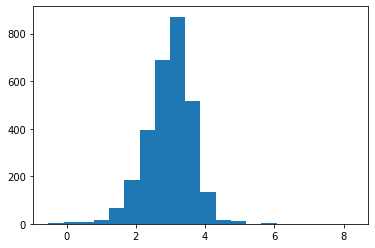

In [21]:
num_bins = 20
plt.hist(np.log(df['VMT_per_capita2020-04-10']).dropna(), num_bins)
plt.show()

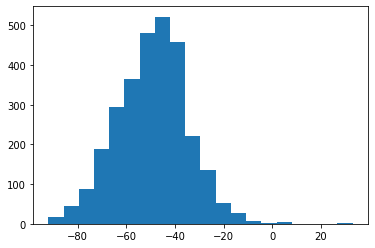

In [22]:
num_bins = 20
plt.hist(df['VMT_percent_change2020-04-10'].dropna(), num_bins)
plt.show()

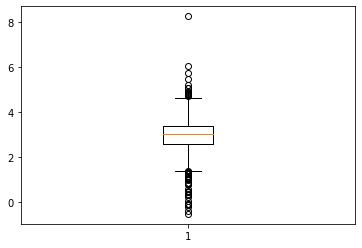

In [23]:
plt.boxplot(np.log(df['VMT_per_capita2020-04-10']).dropna())
plt.show()

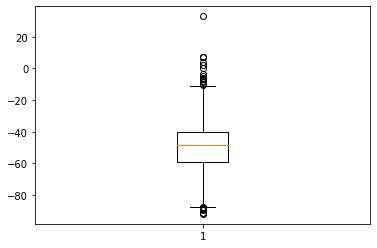

In [24]:
plt.boxplot(df['VMT_percent_change2020-04-10'].dropna())
plt.show()

In [26]:
#state_fips = df['countyFIPS'] % 1000 == 0
fig = ff.create_choropleth(fips = df['countyFIPS'].tolist(), 
                           values = np.log(df['VMT_per_capita2020-04-10']).tolist())
fig.show()

In [27]:
#state_fips = df['countyFIPS'] % 1000 == 0
fig = ff.create_choropleth(fips = df['countyFIPS'].tolist(), 
                           values = df['VMT_percent_change2020-04-10'].tolist())
fig.show()